<img style="padding-right: 25px;" src= "https://raw.githubusercontent.com/e-sensing/sits/master/inst/extdata/sticker/sits_sticker.png" align="left" width="64"/>
<img src="https://raw.githubusercontent.com/brazil-data-cube/code-gallery/master/img/logo-bdc.png" align="right" width="64" />

# <span align="center" style="color:#336699" >Creating data cubes in SITS</span>
<hr style="border:2px solid #0077b9;">

<div style="text-align: left;">
    <a href="https://nbviewer.jupyter.org/github/brazil-data-cube/code-gallery/blob/master/jupyter/R/sits/sits-timeseries-classification.ipynb"><img src="https://raw.githubusercontent.com/jupyter/design/master/logos/Badges/nbviewer_badge.svg" align="center"/></a>
</div>

<br/>

<div style="text-align: center;font-size: 90%;">
    Rolf Simoes<sup><a href="https://orcid.org/0000-0003-0953-4132"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>, Felipe Souza<sup><a href="https://orcid.org/0000-0001-7534-0219"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>, Gilberto Camara<sup><a href="https://orcid.org/0000-0001-7534-0219"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>
    <br/><br/>
    Earth Observation and Geoinformatics Division, National Institute for Space Research (INPE)
    <br/>
    Avenida dos Astronautas, 1758, Jardim da Granja, São José dos Campos, SP 12227-010, Brazil
    <br/><br/>
    Contact: <a href="mailto:rolfsimoes@gmail.com">rolfsimoes@gmail.com</a>,  <a href="mailto:lipecaso@gmail.com">lipecaso@gmail.com</a>, <a href="mailto:gilberto.camara.inpe@gmail.com">gilberto.camara.inpe@gmail.com</a>
    <br/><br/>
    Last Update: July 19, 2022
</div>

<br/>

<div style="text-align: justify;  margin-left: 15%; margin-right: 15%;">
<b>Abstract.</b> SITS is an open-source R package for satellite image time series analysis. The package supports the application of machine learning techniques for classification image time series obtained from data cubes.This Jupyter Notebook shows how to work with data cubes in `sits`. This notebook corresponds to the chapter "Earth Observation Data Cubes" in the <a href="https://e-sensing.github.io/sitsbook/" target="_blank"> book on the SITS package</a>.
</div>    

<br/>
<div style="text-align: justify;  margin-left: 15%; margin-right: 15%;font-size: 100%; border-style: solid; border-color: #0077b9; border-width: 1px; padding: 5px;">
    <b>For a comprehensive sits overview and discussion, please, refer to the following gihub book:</b>
    <div style="margin-left: 10px; margin-right: 10px">
    Simoes, R; Camara, G.; Souza, F.; Santos, L.; Andrade, P.; Carvalho, A.; Ferreira, K.; Queiroz, G. <a href="https://e-sensing.github.io/sitsbook/" target="_blank">sits: Satellite Image Time Series</a>.
    </div>
</div>

## Image data cubes as the basis for big Earth observation data analysis
<hr style="border:1px solid #0077b9;">

To take full advantage of the cloud computing model, Earth observation data needs to be available to users as *data cubes*, whose aim is to organize satellite data for a given area in a consistent spatiotemporal arrangement. A *data cube* should meet the following definition:

1. A data cube is a four-dimensional structure with dimensions x (longitude or easting), y (latitude or northing), time, and bands.
2. Its spatial dimensions refer to a single spatial reference system (SRS). Cells of a data cube have a constant spatial size with respect to the cube’s SRS.
3. The temporal dimension is composed of a set of continuous and equally-spaced intervals. 
4. For every combination of dimensions, a cell has a single value.

A data cube defines a regular partition of space-time. All cells of a data cube have the same spatiotemporal extent. The spatial resolution of each cell is the same in X and Y dimensions. All temporal intervals are the same. Each cell contains a valid set of measures. For each position in space, the data cube should provide a valid time series. For each time interval, the data cube should provide a valid 2D image. 
![](https://raw.githubusercontent.com/e-sensing/sitsbook/master/images/datacube_conception.png)


## Analysis-ready data image collections 
<hr style="border:1px solid #0077b9;">
Data available in cloud services such as Amazon Web Service (AWS), Microsoft's Planetary Computer, and Digital Earth Africa (DE Africa) does not adhere to the definition of data cubes stated above. These data sets are better described as collections of analysis-ready data (ARD) which have been processed by space agencies to improve multidate comparability. Such processing includes conversion from radiance measures at the top of the atmosphere to reflectance measures from ground areas. Variations in sun incidence angles are also compensated. The image is usually reprocessed to a well-known cartographic projection. We define an *ARD image collections* as:

1. An ARD image collection is a set of files from a given sensor (or a combined set of sensors) that has been corrected to ensure comparability of measurements between different dates.
2. All images are reprojected to a cartographic projection following well-established standards.
3. Image collections are cropped into a tiling system.  
4. Timelines of the images that are part of one tile are not regular. Also, these timelines are not the same as those associated to a different tile. Thus, timelines for large areas are not consistent.
5. ARD image collections do not guarantee that every pixel of an image has a valid value, since its images still contains cloudy or missing pixels. 

## Regularizing ARD collections to build data cubes
<hr style="border:1px solid #0077b9;">
To produce regular data cubes from collections available in AWS, Digital Earth Africa, and Microsoft's Planetary Computer, use `sits_regularize()`, which calls the package `gdalcubes`. For details in gdalcubes, please see [https://github.com/appelmar/gdalcubes](https://github.com/appelmar/gdalcubes). The regularization processing works as follows (figure courtesy of Marius Appel):

1. Create an irregular data cube from an analysis-ready data image collection. 
2. Define the parameters of the regular data cube to be produced.
3. Generate the regular data cube by image warping and temporal aggregation. 

![Figure 2](https://raw.githubusercontent.com/e-sensing/sitsbook/master/images/data_cube_generation.png)


## Working with AWS OPENDATA Sentinel-2 collections
<hr style="border:1px solid #0077b9;">

In [9]:
library(sits)
library(sitsdata)

In [10]:
# What collections are available to work with SITS in AWS OPEN DATA? 
sits_list_collections()

BDC:
- CB4_64-1 (CBERS-4/AWFI)
- bands: NDVI EVI B13 B14 B15 B16 CLOUD
- opendata collection (requires access token)

- CB4_64_16D_STK-1 (CBERS-4/AWFI)
- bands: NDVI EVI B13 B14 B15 B16 CLOUD
- opendata collection (requires access token)

- CB4MUX_20-1 (CBERS-4/MUX)
- bands: NDVI EVI B5 B6 B7 B8 CLOUD
- opendata collection (requires access token)

- CB4_20_1M_STK-1 (CBERS-4/MUX)
- bands: NDVI EVI B5 B6 B7 B8 CLOUD
- opendata collection (requires access token)

- LC8_30-1 (LANDSAT-8/OLI)
- bands: NDVI EVI B1 B2 B3 B4 B5 B6 B7 CLOUD
- opendata collection (requires access token)

- LC8_30_16D_STK-1 (LANDSAT-8/OLI)
- bands: NDVI EVI B1 B2 B3 B4 B5 B6 B7 CLOUD
- opendata collection (requires access token)

- MOD13Q1-6 (TERRA/MODIS)
- bands: NDVI EVI BLUE RED NIR MIR CLOUD
- opendata collection (requires access token)

- MYD13Q1-6 (AQUA/MODIS)
- bands: NDVI EVI BLUE RED NIR MIR CLOUD
- opendata collection (requires access token)

- S2-SEN2COR_10_16D_STK-1 (SENTINEL-2/MSI)
- bands: NDVI EVI B

Create a data cube using **AWS Sentinel-2 Open Data** collection. The user defines an image collection, a spatiotemporal extent, bands, and optionally a bounding box.  
The data cube is defined as one tile (`"20LKP"`) of the `"SENTINEL-S2-L2A-COGS"` collection 

In [11]:
# create a data cube based on a collection in the AWS
s2_cube <- sits_cube(
      source = "AWS",
      collection = "SENTINEL-S2-L2A-COGS",
      bands = c("B03", "B08", "B11", "CLOUD"),
      tiles = "20LKP",
      start_date = "2018-07-01",
      end_date = "2018-09-30"
)
# see the timeline of the cube
sits_timeline(s2_cube)

  |======================================================================| 100%


[1] "2018-07-03" "2018-07-08" "2018-07-13" "2018-07-18" "2018-07-23"
 [6] "2018-07-28" "2018-08-02" "2018-08-07" "2018-08-12" "2018-08-17"
[11] "2018-08-22" "2018-08-27" "2018-09-01" "2018-09-06" "2018-09-11"
[16] "2018-09-21" "2018-09-26"

In [12]:
print(s2_cube$file_info[[1]])

# A tibble: 72 × 13
   fid      date       band   xres  yres   xmin   ymin   xmax   ymax nrows ncols
   <chr>    <date>     <chr> <dbl> <dbl>  <dbl>  <dbl>  <dbl>  <dbl> <dbl> <dbl>
 1 S2A_20L… 2018-07-03 B03      10    10 199980 8.79e6 309780 8.90e6 10980 10980
 2 S2A_20L… 2018-07-03 B08      10    10 199980 8.79e6 309780 8.90e6 10980 10980
 3 S2A_20L… 2018-07-03 B11      20    20 199980 8.79e6 309780 8.90e6  5490  5490
 4 S2A_20L… 2018-07-03 CLOUD    20    20 199980 8.79e6 309780 8.90e6  5490  5490
 5 S2B_20L… 2018-07-08 B03      10    10 199980 8.79e6 309780 8.90e6 10980 10980
 6 S2B_20L… 2018-07-08 B08      10    10 199980 8.79e6 309780 8.90e6 10980 10980
 7 S2B_20L… 2018-07-08 B11      20    20 199980 8.79e6 309780 8.90e6  5490  5490
 8 S2B_20L… 2018-07-08 CLOUD    20    20 199980 8.79e6 309780 8.90e6  5490  5490
 9 S2A_20L… 2018-07-13 B03      10    10 199980 8.79e6 309780 8.90e6 10980 10980
10 S2A_20L… 2018-07-13 B08      10    10 199980 8.79e6 309780 8.90e6 10980 10980
# … with

## Why create regular data cubes?
<hr style="border:1px solid #0077b9;">

Building regular data cubes from image collections available in cloud services is highly recommended. The resulting data cubes will be consistent in time and space. Processing will be faster and results will be better in general. 

> We suggest always building regular cubes from AWS OPENDATA collections the resulting images will be written to a local directory


In [13]:
# regularize the data cube
s2_regular_cube <- sits_regularize(
      s2_cube,
      res = 60, 
      output_dir = ".",
      period = "P16D",
      multicores = 4
)

# see the timeline of the regular cube
sits_timeline(s2_regular_cube)

  |======================================================================| 100%


[1] "2018-07-03" "2018-07-13" "2018-07-19" "2018-07-29" "2018-08-04"
 [6] "2018-08-14" "2018-08-20" "2018-08-30" "2018-09-05" "2018-09-15"
[11] "2018-09-21" "2018-10-01" "2018-10-17" "2018-11-02" "2018-11-18"
[16] "2018-12-04" "2018-12-20" "2019-01-05" "2019-01-21" "2019-02-06"
[21] "2019-02-22" "2019-03-10" "2019-03-26" "2019-04-11" "2019-04-27"
[26] "2019-05-13"

HTML widgets cannot be represented in plain text (need html)
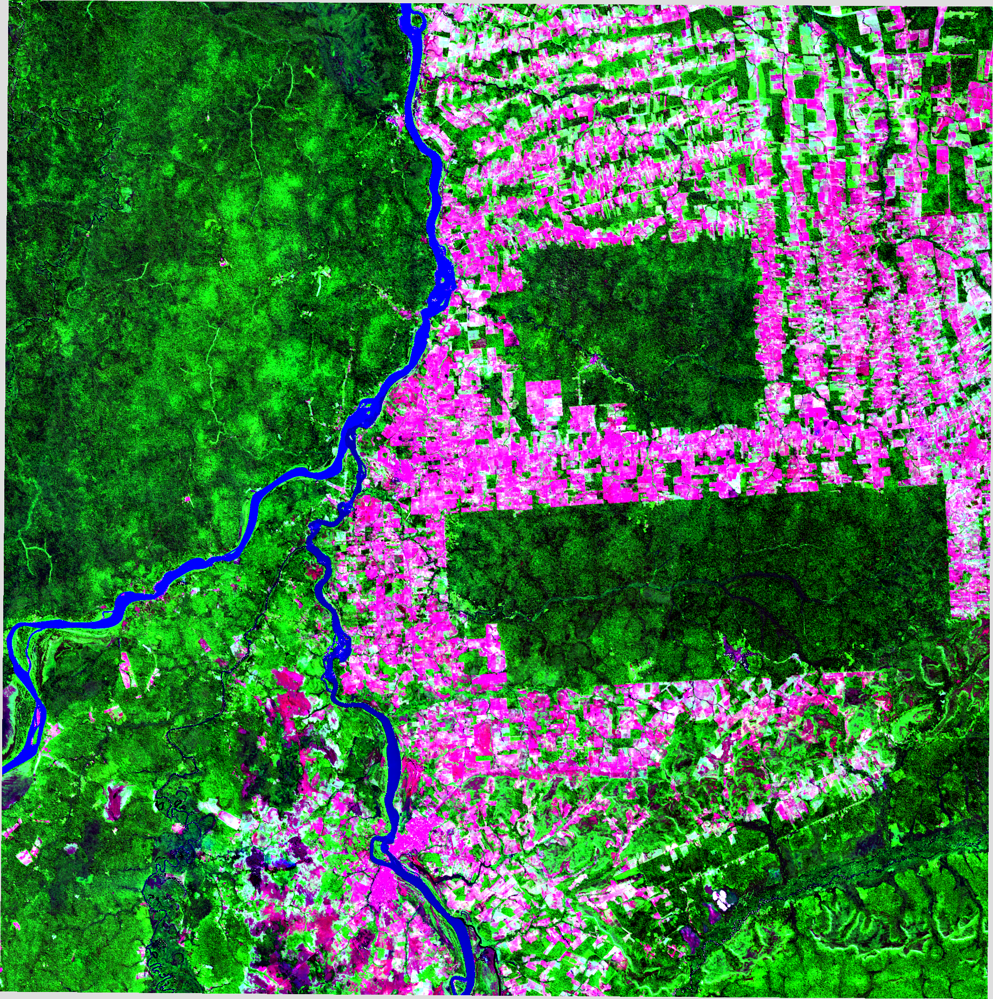

In [14]:
# plot one of the images of the cube
sits_view(s2_regular_cube, red = "B11", green = "B08", blue = "B03", time = 1)

## Using the Brazil Data Cube
<hr style="border:1px solid #0077b9;">

The [Brazil Data Cube](http://brazildatacube.org/) (BDC) is being developed by Brazil’s National Institute for Space Research (INPE). Its goal is to create multidimensional data cubes of analysis-ready data Brazil. The BDC uses three hierarchical grids based on the Albers Equal Area projection and SIRGAS 2000 datum. The three grids are generated taking -54 $^\circ$ longitude as the central reference and defining tiles of 6x4, 3x2 and 1.5x1.5 degrees. The large grid is used for CBERS-4 AWFI collections at 64 meter resolution. The medium grid is used for Landsat-8 OLI collections at 30 meter resolution. The small grid is used for Sentinel-2 MSI collections at 10m resolutions. The data cubes in the BDC are regularly spaced in time and cloud-corrected.

<img src= "https://raw.githubusercontent.com/e-sensing/sitsbook/master/images/bdc_grid.png" width="800">

> #### Note: To access the Brazil Data Cube, you will need a token. Please register at the BDC site and get your token. For more details, see the [instructions](https://brazil-data-cube.github.io/applications/dc_explorer/token-module.html).

In [19]:
Sys.setenv(BDC_ACCESS_KEY = "change-me")

In [16]:
# What collections are available in the Brazil Data Cube?
sits_list_collections(source = "BDC")

BDC:
- CB4_64-1 (CBERS-4/AWFI)
- bands: NDVI EVI B13 B14 B15 B16 CLOUD
- opendata collection (requires access token)

- CB4_64_16D_STK-1 (CBERS-4/AWFI)
- bands: NDVI EVI B13 B14 B15 B16 CLOUD
- opendata collection (requires access token)

- CB4MUX_20-1 (CBERS-4/MUX)
- bands: NDVI EVI B5 B6 B7 B8 CLOUD
- opendata collection (requires access token)

- CB4_20_1M_STK-1 (CBERS-4/MUX)
- bands: NDVI EVI B5 B6 B7 B8 CLOUD
- opendata collection (requires access token)

- LC8_30-1 (LANDSAT-8/OLI)
- bands: NDVI EVI B1 B2 B3 B4 B5 B6 B7 CLOUD
- opendata collection (requires access token)

- LC8_30_16D_STK-1 (LANDSAT-8/OLI)
- bands: NDVI EVI B1 B2 B3 B4 B5 B6 B7 CLOUD
- opendata collection (requires access token)

- MOD13Q1-6 (TERRA/MODIS)
- bands: NDVI EVI BLUE RED NIR MIR CLOUD
- opendata collection (requires access token)

- MYD13Q1-6 (AQUA/MODIS)
- bands: NDVI EVI BLUE RED NIR MIR CLOUD
- opendata collection (requires access token)

- S2-SEN2COR_10_16D_STK-1 (SENTINEL-2/MSI)
- bands: NDVI EVI B

Creating a data cube using the BDC is similar to what is required for **AWS**. The user defines an image collection, a set of tiles, a spatiotemporal extent, bands, and optionally a bounding box. In the example below, the data cube is defined as one tile (`"022024"`) of `"CB4_64_16D_STK-1"` collection which holds **CBERS AWFI** images at 16 days resolution. 


In [17]:
# create a data cube based on a collection in the BDC
cbers_tile <- sits_cube(
    source = "BDC",
    collection = "CB4_64_16D_STK-1",
    bands = c("NDVI", "EVI"),
    tiles = "022024",
    start_date = "2018-09-01",
    end_date = "2019-08-28"
)

  |======================================================================| 100%


In [18]:
print(cbers_tile)

# A tibble: 1 × 11
  source colle…¹ satel…² sensor tile    xmin   xmax   ymin   ymax crs   file_i…³
  <chr>  <chr>   <chr>   <chr>  <chr>  <dbl>  <dbl>  <dbl>  <dbl> <chr> <list>  
1 BDC    CB4_64… CBERS-4 AWFI   0220… 5.63e6 6.31e6 9.66e6 1.01e7 "PRO… <tibble>
# … with abbreviated variable names ¹​collection, ²​satellite, ³​file_info
